In [2303]:
# libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as matplot
import seaborn as sns
import os
import sqlite3
%matplotlib inline
import plotly.express as px
from plotly import graph_objs as go
import plotly.figure_factory as ff
#from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler

from sklearn.compose import make_column_transformer
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import OneHotEncoder
import missingno as msno
from scipy.stats import zscore
from scipy.stats import chi2_contingency
from scipy.stats import chi2

import warnings
warnings.filterwarnings("ignore")

import toolkit as tool

In [2304]:
# loading dataset.
df = pd.read_csv('../datasets/HR_COM1.CSV')
df.head()

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,dept,salary
0,1,0.38,0.53,2,157,3,0,1,0,sales,low
1,2,0.80,0.86,5,262,6,0,1,0,sales,medium
2,3,0.11,0.88,7,272,4,0,1,0,sales,medium
3,4,0.72,0.87,5,223,5,0,1,0,sales,low
4,5,0.37,0.52,2,159,3,0,1,0,sales,low


In [2305]:
df['Emp ID'] = df['Emp ID'].iloc[:] = 1
df

,Emp ID,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,dept,salary
0,1,0.38,0.53,2,157,3,0,1,0,sales,low
1,1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,1,0.11,0.88,7,272,4,0,1,0,sales,medium
3,1,0.72,0.87,5,223,5,0,1,0,sales,low
4,1,0.37,0.52,2,159,3,0,1,0,sales,low
...,...,...,...,...,...,...,...,...,...,...,...
14994,1,0.90,0.55,3,259,10,1,0,1,management,high
14995,1,0.74,0.95,5,266,10,0,0,1,management,high
14996,1,0.85,0.54,3,185,10,0,0,1,management,high
14997,1,0.33,0.65,3,172,10,0,0,1,marketing,high


In [2306]:
shape_rows = df.shape[0]
shape_columns = df.shape[1]

print(f'Dataset rows = {shape_rows} and columns = {shape_columns}.')

Dataset rows = 14999 and columns = 11.


In [2307]:
# Check to see if there are missing values in data set
df.isna().sum()

Emp ID                   0
satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
left                     0
promotion_last_5years    0
dept                     0
salary                   0
dtype: int64

In [2308]:
# Check to see if there are duplicated data.
df.duplicated().sum()

3008

<Axes: >

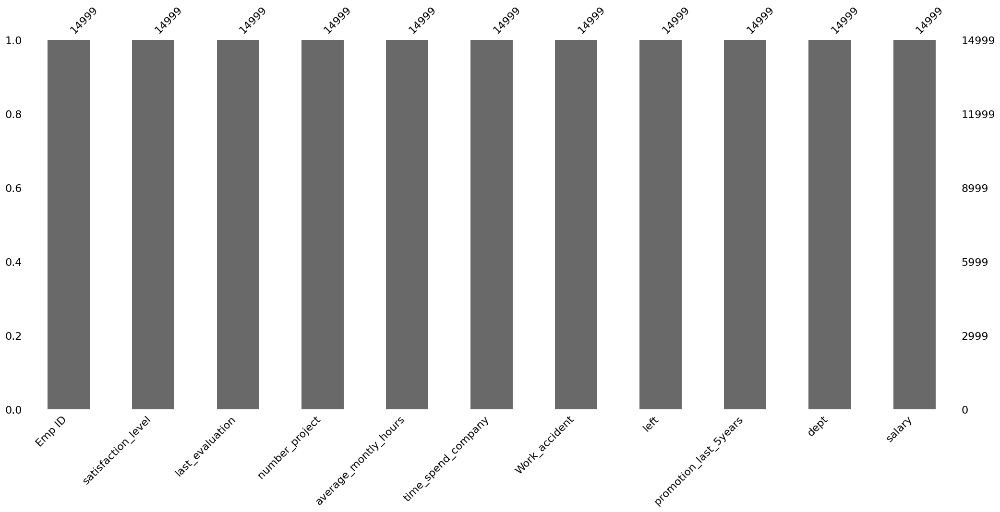

In [2309]:
# Program to visualize missing values in dataset
msno.bar(df)

In [2310]:
le = preprocessing.LabelEncoder()

# Label Encoder category features
df['dept'] = le.fit_transform(df.dept.values)
df['salary'] = le.fit_transform(df.salary.values)

In [2311]:
# rename column names to make thing more easy to identify.
df = df.rename(columns={'satisfaction_level': 'satisfaction', 
                        'last_evaluation': 'evaluation',
                        'number_project': 'projectCount',
                        'average_montly_hours': 'averageMonthlyHours',
                        'time_spend_company': 'yearsAtCompany',
                        'Work_accident': 'workAccident',
                        'promotion_last_5years': 'promotion',
                        'sales' : 'department',
                        'left' : 'turnover'
                        })

In [2312]:
df.dtypes

Emp ID                   int64
satisfaction           float64
evaluation             float64
projectCount             int64
averageMonthlyHours      int64
yearsAtCompany           int64
workAccident             int64
turnover                 int64
promotion                int64
dept                     int64
salary                   int64
dtype: object

In [2313]:
cols = list(df.columns)
cols

['Emp ID',
 'satisfaction',
 'evaluation',
 'projectCount',
 'averageMonthlyHours',
 'yearsAtCompany',
 'workAccident',
 'turnover',
 'promotion',
 'dept',
 'salary']

#### Z-Score: Calculate the Z-score for each data point, and points with a Z-score beyond a certain threshold (e.g., 3 or -3) can be considered outliers.

In [2314]:
z_scores = zscore(df)
abs_z_scores = np.abs(z_scores)
outliers = (abs_z_scores > 3).all(axis=1)
outliers.value_counts(normalize=True).map('{:.2%}'.format)

False    100.00%
Name: proportion, dtype: object

In [2315]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)
outliers.value_counts(normalize=True).map('{:.2%}'.format)

False    56.03%
True     43.97%
Name: proportion, dtype: object

In [2316]:
# https://machinelearningmastery.com/chi-squared-test-for-machine-learning/
# Chi-Squared Test -

def caltable(col1, col2):
    # Create a contingency table (cross-tabulation)
    contingency_table = pd.crosstab(df[f'{col1}'], df[f'{col2}'])

    # Display the contingency table
    #print("Contingency Table:")
    #print(contingency_table)

    return chi2_contingency(contingency_table)
    

# Chi2 test
def chi2test(col1, col2, df_chi2test):
    stat, p, dof, expected = caltable(col1, col2)

    # interpret test-statistic
    prob = 0.95
    critical = chi2.ppf(prob, dof)
    if abs(stat) >= critical:
        #print(f'chi2 Dependent (reject H0) for {col1}-{col2}')
        df_chi2test.at[col1, col2] = 'DEP' # DEP - Dependent
    else:
        #print(f'chi2 Independent (fail to reject H0) {col1}-{col2}')
        df_chi2test.at[col1, col2] = 'IND' # IND - Independent

# p-value
def pvalue(col1, col2, df_pvalue):
    stat, p, dof, expected = caltable(col1, col2)
    # interpret p-value
    prob = 0.95
    alpha = 1.0 - prob
    if p <= alpha:
	    #print(f'p-value - Dependent (reject H0) {col1}-{col2}')
        df_pvalue.at[col1, col2] = 'DEP' # DEP - Dependent
    else:
	    #print(f'p-value - Independent (fail to reject H0) {col1}-{col2}')
        df_pvalue.at[col1, col2] = 'IND' # IND - Independent


In [2317]:
df_chi2test = pd.DataFrame(index=cols, columns=cols)
df_pvalue = pd.DataFrame(index=cols, columns=cols)


### Chi-Squared Test

In [2318]:
for col1 in cols:
    for col2 in cols:
        if col1 == col2:
            continue
        chi2test(col1, col2, df_chi2test)

def highlightr(row):
    return np.where(row.isin(['IND']),
                    'background-color: red', '')

def highlightg(row):
    return np.where(row.isin(['DEP']),
                    'background-color: green', '')

df_chi2test.style.apply(highlightr) # FIXME
df_chi2test.style.apply(highlightg)
#df_chi2test.style.highlight_null(color='red')

,Emp ID,satisfaction,evaluation,projectCount,averageMonthlyHours,yearsAtCompany,workAccident,turnover,promotion,dept,salary
Emp ID,nan,IND,IND,IND,IND,IND,IND,IND,IND,IND,IND
satisfaction,IND,nan,DEP,DEP,DEP,DEP,DEP,DEP,DEP,DEP,DEP
evaluation,IND,DEP,nan,DEP,DEP,DEP,DEP,DEP,DEP,DEP,DEP
projectCount,IND,DEP,DEP,nan,DEP,DEP,DEP,DEP,DEP,DEP,DEP
averageMonthlyHours,IND,DEP,DEP,DEP,nan,DEP,DEP,DEP,DEP,DEP,DEP
yearsAtCompany,IND,DEP,DEP,DEP,DEP,nan,DEP,DEP,DEP,DEP,DEP
workAccident,IND,DEP,DEP,DEP,DEP,DEP,nan,DEP,DEP,DEP,IND
turnover,IND,DEP,DEP,DEP,DEP,DEP,DEP,nan,DEP,DEP,DEP
promotion,IND,DEP,DEP,DEP,DEP,DEP,DEP,DEP,nan,DEP,DEP
dept,IND,DEP,DEP,DEP,DEP,DEP,DEP,DEP,DEP,nan,DEP


In [2319]:
for col1 in cols:
    for col2 in cols:
        if col1 == col2:
            continue
        chi2test(col1, col2, df_pvalue)

### p-value

In [2320]:
df_pvalue.style.apply(highlightr) # FIXME
df_pvalue.style.apply(highlightg)

,Emp ID,satisfaction,evaluation,projectCount,averageMonthlyHours,yearsAtCompany,workAccident,turnover,promotion,dept,salary
Emp ID,nan,IND,IND,IND,IND,IND,IND,IND,IND,IND,IND
satisfaction,IND,nan,DEP,DEP,DEP,DEP,DEP,DEP,DEP,DEP,DEP
evaluation,IND,DEP,nan,DEP,DEP,DEP,DEP,DEP,DEP,DEP,DEP
projectCount,IND,DEP,DEP,nan,DEP,DEP,DEP,DEP,DEP,DEP,DEP
averageMonthlyHours,IND,DEP,DEP,DEP,nan,DEP,DEP,DEP,DEP,DEP,DEP
yearsAtCompany,IND,DEP,DEP,DEP,DEP,nan,DEP,DEP,DEP,DEP,DEP
workAccident,IND,DEP,DEP,DEP,DEP,DEP,nan,DEP,DEP,DEP,IND
turnover,IND,DEP,DEP,DEP,DEP,DEP,DEP,nan,DEP,DEP,DEP
promotion,IND,DEP,DEP,DEP,DEP,DEP,DEP,DEP,nan,DEP,DEP
dept,IND,DEP,DEP,DEP,DEP,DEP,DEP,DEP,DEP,nan,DEP


In [2321]:
# list the type of each feature.
df.dtypes

Emp ID                   int64
satisfaction           float64
evaluation             float64
projectCount             int64
averageMonthlyHours      int64
yearsAtCompany           int64
workAccident             int64
turnover                 int64
promotion                int64
dept                     int64
salary                   int64
dtype: object

In [2322]:
# Convert object types to category types.
df['dept'] = df['dept'].astype('category')
df['salary'] = df['salary'].astype('category')

df.dtypes

Emp ID                    int64
satisfaction            float64
evaluation              float64
projectCount              int64
averageMonthlyHours       int64
yearsAtCompany            int64
workAccident              int64
turnover                  int64
promotion                 int64
dept                   category
salary                 category
dtype: object

In [2323]:
# From observation about 76.1% of employees stayed and 23.8% of employees left.
print(df['turnover'].value_counts(normalize=True).map('{:.2%}'.format))

turnover
0    76.19%
1    23.81%
Name: proportion, dtype: object


In [2324]:
df_ohe = df.copy()

In [2325]:
df_ohe.dtypes

Emp ID                    int64
satisfaction            float64
evaluation              float64
projectCount              int64
averageMonthlyHours       int64
yearsAtCompany            int64
workAccident              int64
turnover                  int64
promotion                 int64
dept                   category
salary                 category
dtype: object

In [2326]:
# label_encoder object knows  
# how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 

In [2327]:
# Encode labels in column 'species'. 
df_ohe['dept']= label_encoder.fit_transform(df['dept']) 
df_ohe['salary']= label_encoder.fit_transform(df['salary']) 

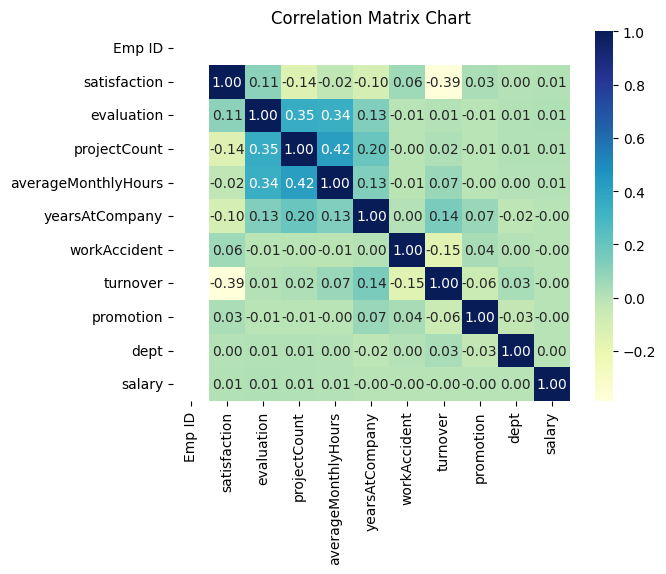

,Emp ID,satisfaction,evaluation,projectCount,averageMonthlyHours,yearsAtCompany,workAccident,turnover,promotion,dept,salary
Emp ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
satisfaction,NaN,1.000000,0.105021,-0.142970,-0.020048,-0.100866,0.058697,-0.388375,0.025605,0.003153,0.011754
evaluation,NaN,0.105021,1.000000,0.349333,0.339742,0.131591,-0.007104,0.006567,-0.008684,0.007772,0.013965
projectCount,NaN,-0.142970,0.349333,1.000000,0.417211,0.196786,-0.004741,0.023787,-0.006064,0.009268,0.009672
averageMonthlyHours,NaN,-0.020048,0.339742,0.417211,1.000000,0.127755,-0.010143,0.071287,-0.003544,0.003913,0.007082
yearsAtCompany,NaN,-0.100866,0.131591,0.196786,0.127755,1.000000,0.002120,0.144822,0.067433,-0.018010,-0.003086
workAccident,NaN,0.058697,-0.007104,-0.004741,-0.010143,0.002120,1.000000,-0.154622,0.039245,0.003425,-0.002506
turnover,NaN,-0.388375,0.006567,0.023787,0.071287,0.144822,-0.154622,1.000000,-0.061788,0.032105,-0.001294
promotion,NaN,0.025605,-0.008684,-0.006064,-0.003544,0.067433,0.039245,-0.061788,1.000000,-0.027336,-0.001318
dept,NaN,0.003153,0.007772,0.009268,0.003913,-0.018010,0.003425,0.032105,-0.027336,1.000000,0.000685


In [2328]:
# Correction between the features and the target.
corr = df_ohe.corr()
corr = (corr)
ax = plt.axes()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values, ax=ax, fmt=".2f", cmap="YlGnBu", cbar=True, annot = True)
ax.set_title('Correlation Matrix Chart')
plt.show()
corr

In [2329]:
df.columns

Index(['Emp ID', 'satisfaction', 'evaluation', 'projectCount',
       'averageMonthlyHours', 'yearsAtCompany', 'workAccident', 'turnover',
       'promotion', 'dept', 'salary'],
      dtype='object')

In [2330]:
columns_boxplot = ['satisfaction', 'evaluation', 'projectCount'
                   ,'yearsAtCompany', 'workAccident', 'turnover',
       'promotion']

In [2331]:
employee_data = df[columns_boxplot]

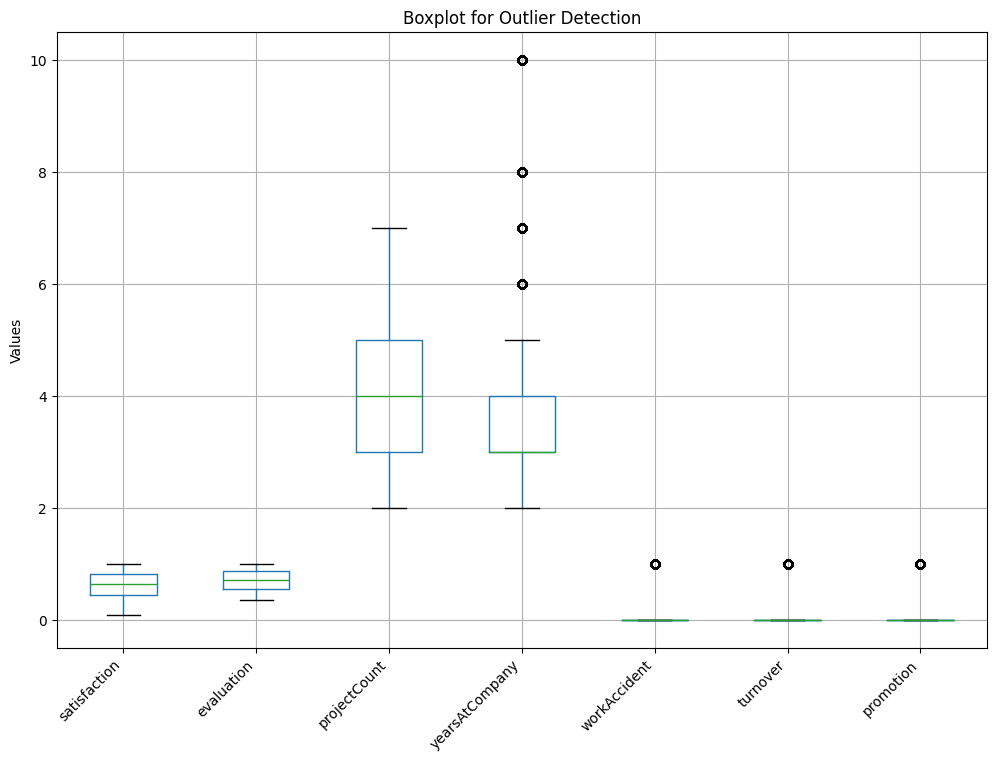

In [2332]:
# Create a boxplot for each column in the DataFrame
plt.figure(figsize=(12, 8))
employee_data.boxplot()
plt.title('Boxplot for Outlier Detection')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.ylabel('Values')
plt.show()

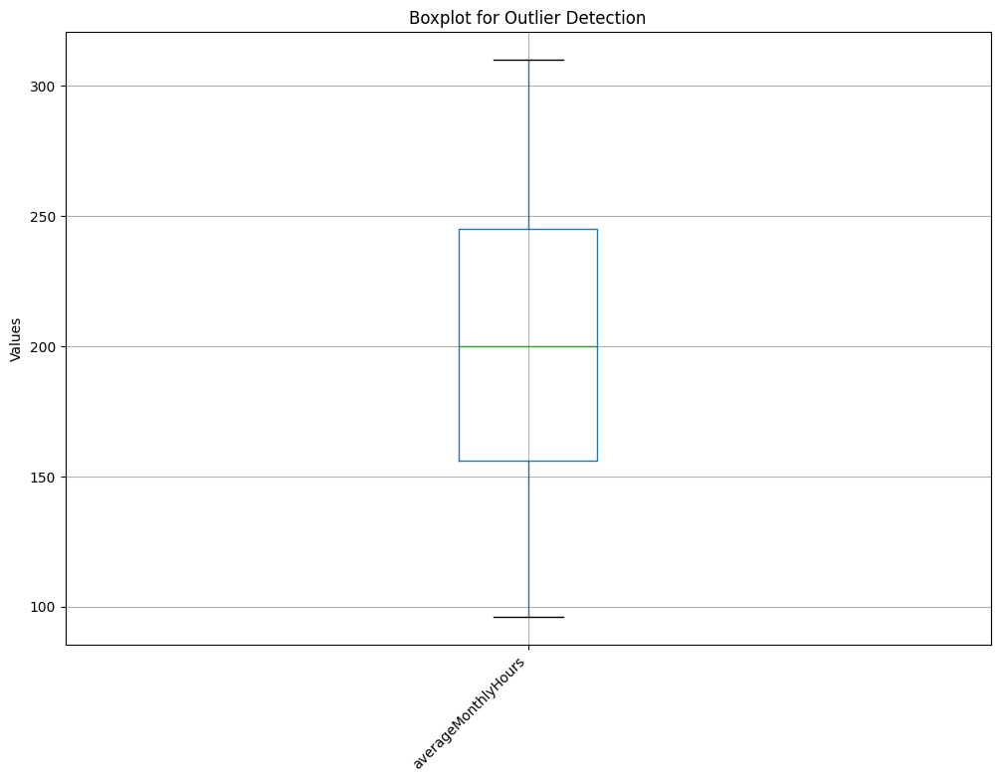

In [2333]:
# Create a boxplot for each column in the DataFrame
fig = plt.figure(figsize=(12, 8))
ax = fig.gca()

df.boxplot(column='averageMonthlyHours', ax =ax)
plt.title('Boxplot for Outlier Detection')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.ylabel('Values')
plt.show()

In [2334]:
df['yearsAtCompany'].value_counts(normalize=True).map('{:.2%}'.format)

yearsAtCompany
3     42.96%
2     21.63%
4     17.05%
5      9.82%
6      4.79%
10     1.43%
7      1.25%
8      1.08%
Name: proportion, dtype: object

In [2335]:
df['dept'].value_counts(normalize=True).map('{:.2%}'.format)

dept
7    27.60%
9    18.13%
8    14.86%
0     8.18%
6     6.01%
5     5.72%
1     5.25%
2     5.11%
3     4.93%
4     4.20%
Name: proportion, dtype: object

In [2336]:
df.columns

Index(['Emp ID', 'satisfaction', 'evaluation', 'projectCount',
       'averageMonthlyHours', 'yearsAtCompany', 'workAccident', 'turnover',
       'promotion', 'dept', 'salary'],
      dtype='object')

In [2337]:
df['salary'].value_counts(normalize=True).map('{:.2%}'.format)

salary
1    48.78%
2    42.98%
0     8.25%
Name: proportion, dtype: object

In [2338]:
fig = px.histogram(df, x="satisfaction", y="Emp ID", color="turnover",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.update_layout(title_text='Employee Distribution Plot - Satisfaction Level',xaxis_title="Satisfaction",
    yaxis_title="No of Employees")
fig.show()

In [2339]:
fig = px.histogram(df, x="evaluation", y="Emp ID", color="turnover",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.update_layout(title_text='Employee Distribution Plot - Evaluation Level',xaxis_title="Evaluation",
    yaxis_title="No of Employees")
fig.show()

In [2340]:
fig = px.histogram(df, x="averageMonthlyHours", y="Emp ID", color="turnover",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.update_layout(title_text='Employee Distribution Plot - Average Monthly Hours',xaxis_title="Average Monthly Hours",
    yaxis_title="No of Employees")
fig.show()

### Salary V.S. Turnover

 - Majority of employees who left either had low or medium salary.
 - Barely any employees left with high salary
 - Employees with low to average salaries tend to leave the company.

In [2341]:
fig = go.Figure()
for name, group in df.groupby('turnover'):
    trace = go.Histogram()
    trace.name = name
    trace.x = group['salary']
    fig.add_trace(trace)
fig.update_layout(title_text='Employee Distribution - Salary V.S. Turnover',xaxis_title="Salary",
    yaxis_title="No of Employees")
fig.show()

In [2342]:
fig = go.Figure()
for name, group in df.groupby('turnover'):
    trace = go.Histogram()
    trace.name = name
    trace.x = group['dept']
    fig.add_trace(trace)
fig.update_layout(title_text='Employee Distribution - Department V.S. Turnover',xaxis_title="Department",
    yaxis_title="No of Employees")
fig.show()

### Turnover V.S. ProjectCount

- More than half of the employees with 2,6, and 7 projects left the company
- Majority of the employees who did not leave the company had 3,4, and 5 projects
- All of the employees with 7 projects left the company
- There is an increase in employee turnover rate as project count increases

In [2343]:
fig = go.Figure()
for name, group in df.groupby('turnover'):
    trace = go.Histogram()
    trace.name = name
    trace.x = group['projectCount']
    fig.add_trace(trace)
fig.update_layout(title_text='Employee Distribution - Turnover V.S. Project Count',xaxis_title="Project Count",
    yaxis_title="No of Employees")    
fig.show()

### Turnover V.S. Evaluation

- There is a biomodal distribution for those that had a turnover.
- Employees with low performance tend to leave the company more
- Employees with high performance tend to leave the company more
- The sweet spot for employees that stayed is within 0.6-0.8 evaluation

In [2344]:
x1 = df.loc[(df['turnover'] == 0),'evaluation']
x2 = df.loc[(df['turnover'] == 1),'evaluation']

group_labels = ['no turnover', 'turnover']

colors = ['blue', 'red']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([x1, x2], group_labels, bin_size=1.0,
                         curve_type='kde', # override default 'kde'
                         colors=colors, show_hist=False)

# Add title
fig.update_layout(title_text='Employee Evaluation Distribution KDE - Turnover V.S. No Turnover')
fig.show()

### Turnover V.S. AverageMonthlyHours

- Another bi-modal distribution for employees that turnovered
- Employees who had less hours of work (~150hours or less) left the company more
- Employees who had too many hours of work (~250 or more) left the company
- Employees who left generally were underworked or overworked.

In [2345]:
x1 = df.loc[(df['turnover'] == 0),'averageMonthlyHours']
x2 = df.loc[(df['turnover'] == 1),'averageMonthlyHours']

group_labels = ['no turnover', 'turnover']

colors = ['blue', 'red']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([x1, x2], group_labels, bin_size=1.0,
                         curve_type='kde', # override default 'kde'
                         colors=colors, show_hist=False)

# Add title
fig.update_layout(title_text='Employee AverageMonthly Hours Distribution KDE - Turnover V.S. No Turnover')
fig.show()

### Turnover V.S. Satisfaction

- There is a tri-modal distribution for employees that turnovered
- Employees who had really low satisfaction levels (0.2 or less) left the company more
- Employees who had low satisfaction levels (0.3~0.5) left the company more
- Employees who had really high satisfaction levels (0.7 or more) left the company more

In [2346]:
x1 = df.loc[(df['turnover'] == 0),'satisfaction']
x2 = df.loc[(df['turnover'] == 1),'satisfaction']

group_labels = ['no turnover', 'turnover']

colors = ['blue', 'red']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot([x1, x2], group_labels, bin_size=1.0,
                         curve_type='kde', # override default 'kde'
                         colors=colors, show_hist=False)

# Add title
fig.update_layout(title_text='Employee Satisfaction Distribution KDE - Turnover V.S. No Turnover')
fig.show()

### ProjectCount VS AverageMonthlyHours

- As project count increased, so did average monthly hours
- Something weird about the boxplot graph is the difference in averageMonthlyHours between people who had a turnover and did not.
- Looks like employees who did not have a turnover had consistent averageMonthlyHours, despite the increase in projects
- In contrast, employees who did have a turnover had an increase in averageMonthlyHours with the increase in projects

In [2347]:
fig = px.box(df,x="projectCount", y="averageMonthlyHours", color="turnover")
fig.update_layout(title_text='Project Count V.S. Average Monthly Hours',xaxis_title="Project Count",
    yaxis_title="Average Monthly Hours")
fig.show()

### ProjectCount VS Evaluation
Summary: This graph looks very similar to the graph above. What I find strange with this graph is with the turnover group. There is an increase in evaluation for employees who did more projects within the turnover group. But, again for the non-turnover group, employees here had a consistent evaluation score despite the increase in project counts.

*Observations

- Why is it that employees who left, had on average, a higher evaluation than employees who did not leave, even with an increase in project count?
- Shouldn't employees with lower evaluations tend to leave the company more?

In [2348]:
#ProjectCount VS Evaluation
#Looks like employees who did not leave the company had an average evaluation of around 70% even with different projectCounts
#There is a huge skew in employees who had a turnover though. It drastically changes after 3 projectCounts. 
#Employees that had two projects and a horrible evaluation left. Employees with more than 3 projects and super high evaluations left
fig = px.box(df,x="projectCount", y="evaluation", color="turnover")
fig.update_layout(title_text='Project Count V.S. Evaluation',xaxis_title="Project Count",
    yaxis_title="Evaluation")
fig.show()

### Satisfaction VS Evaluation

- Cluster 1 (Hard-working and Sad Employee)

- Cluster 2 (Bad and Sad Employee)

- Cluster 3 (Hard-working and Happy Employee)

In [2349]:
fig = px.scatter(df, x="satisfaction", y="evaluation",color="turnover")
fig.update_layout(title_text='Satisfaction V.S. Evaluation Cluster Chart', xaxis_title="Satisfaction",
    yaxis_title="Evaluation")
fig.show()

### Turnover V.S. YearsAtCompany

- More than half of the employees with 4 and 5 years left the company
- Employees with 5 years should highly be looked into

In [2350]:
import plotly.express as px

fig = px.histogram(df, x="yearsAtCompany", y="Emp ID", color="turnover",
                   marginal="", # or violin, rug
                   hover_data=df.columns)
fig.update_layout(title_text='Turnover Rate V.S. Years Spent', xaxis_title="Years Spent",
    yaxis_title="No of Employees")
fig.show()

In [2351]:
df

,Emp ID,satisfaction,evaluation,projectCount,averageMonthlyHours,yearsAtCompany,workAccident,turnover,promotion,dept,salary
0,1,0.38,0.53,2,157,3,0,1,0,7,1
1,1,0.80,0.86,5,262,6,0,1,0,7,2
2,1,0.11,0.88,7,272,4,0,1,0,7,2
3,1,0.72,0.87,5,223,5,0,1,0,7,1
4,1,0.37,0.52,2,159,3,0,1,0,7,1
...,...,...,...,...,...,...,...,...,...,...,...
14994,1,0.90,0.55,3,259,10,1,0,1,4,0
14995,1,0.74,0.95,5,266,10,0,0,1,4,0
14996,1,0.85,0.54,3,185,10,0,0,1,4,0
14997,1,0.33,0.65,3,172,10,0,0,1,5,0


In [2352]:
# Save DataFrame to CSV without index
df.to_csv('../datasets/HR_COM1_catboostmodel.csv', index=False)

os.system('date')

0

Wed 24 Jan 2024 02:10:29 PM -03


In [2353]:
le = preprocessing.LabelEncoder()

# Label Encoder category features
df['dept'] = le.fit_transform(df.dept.values)
df['salary'] = le.fit_transform(df.salary.values)
df

,Emp ID,satisfaction,evaluation,projectCount,averageMonthlyHours,yearsAtCompany,workAccident,turnover,promotion,dept,salary
0,1,0.38,0.53,2,157,3,0,1,0,7,1
1,1,0.80,0.86,5,262,6,0,1,0,7,2
2,1,0.11,0.88,7,272,4,0,1,0,7,2
3,1,0.72,0.87,5,223,5,0,1,0,7,1
4,1,0.37,0.52,2,159,3,0,1,0,7,1
...,...,...,...,...,...,...,...,...,...,...,...
14994,1,0.90,0.55,3,259,10,1,0,1,4,0
14995,1,0.74,0.95,5,266,10,0,0,1,4,0
14996,1,0.85,0.54,3,185,10,0,0,1,4,0
14997,1,0.33,0.65,3,172,10,0,0,1,5,0


In [2354]:
# Save DataFrame to CSV without index
df.to_csv('../datasets/HR_COM1_tomodel.csv', index=False)